<a href="https://colab.research.google.com/github/thebabycode/Computer-Vision/blob/main/CV_Lab4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1. Write a python openCV code to convert the image from the given color model to different  color models.

2. Include different types of noises in the input image with various densities and perform the following

i) Apply linear and non-linear filters to the noise contaminated image with different mask size.

ii) Display and interpret the result

#1. One color model to different color models.

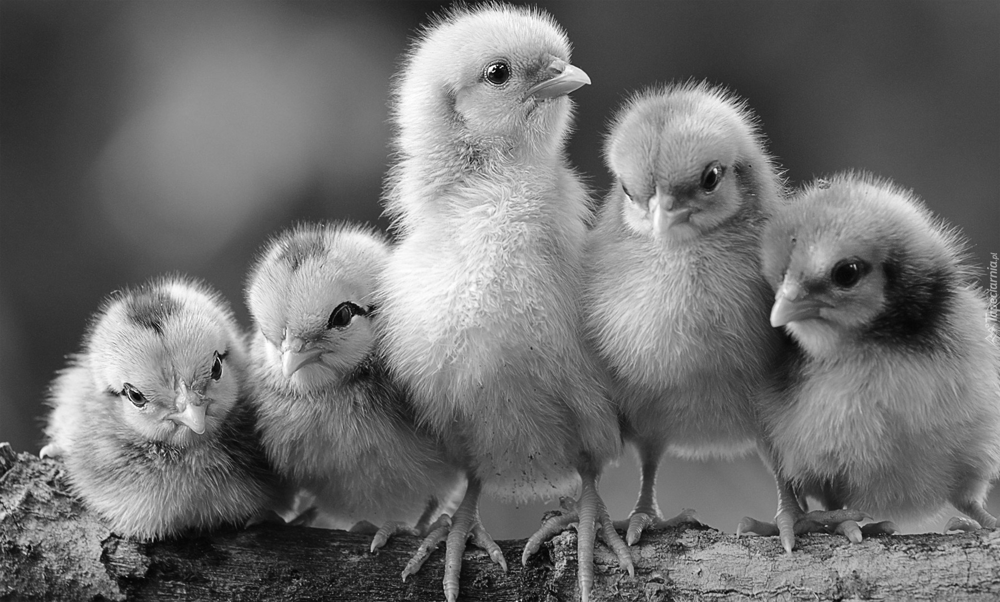

In [ ]:
import cv2 
from google.colab.patches import cv2_imshow
src = cv2.imread("image2.jpg")
window_name = 'Image'
image = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY )
cv2_imshow( image)


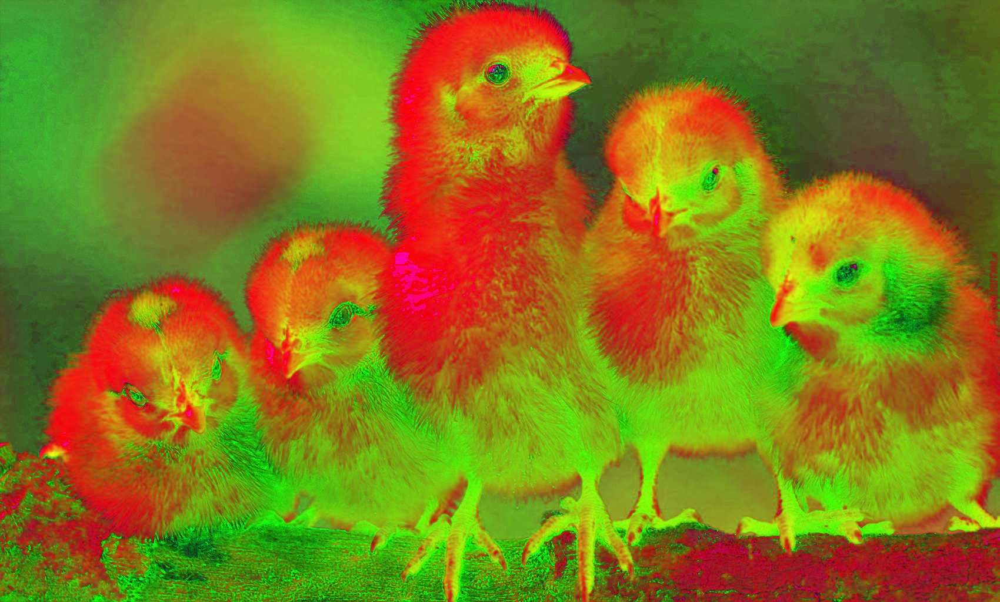

In [ ]:
#The hue represents the color. 
# The saturation value tells us how much quantity of respective color must be added.
#The value represents the brightness concerning the saturation of the color. the value 0 represents total black darkness,
# while the value 100 will mean a full brightness and depend on the saturation.
image = cv2.cvtColor(src, cv2.COLOR_BGR2HSV )
cv2_imshow( image)

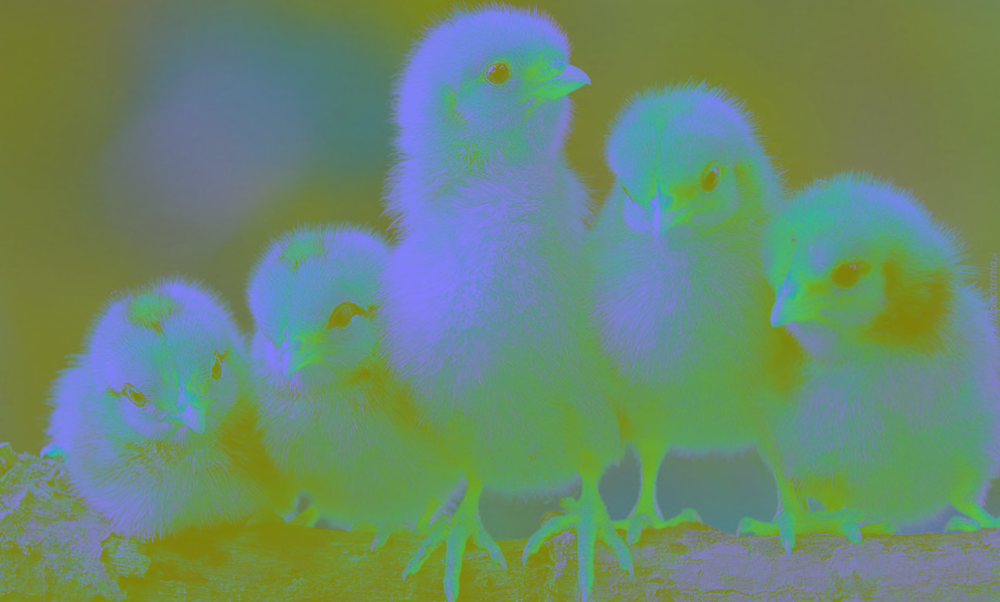

In [ ]:
image = cv2.cvtColor(src, cv2.COLOR_BGR2YCrCb)
cv2_imshow( image)
#Cb is the blue component relative to the green component. Cr is the red component relative to the green component.

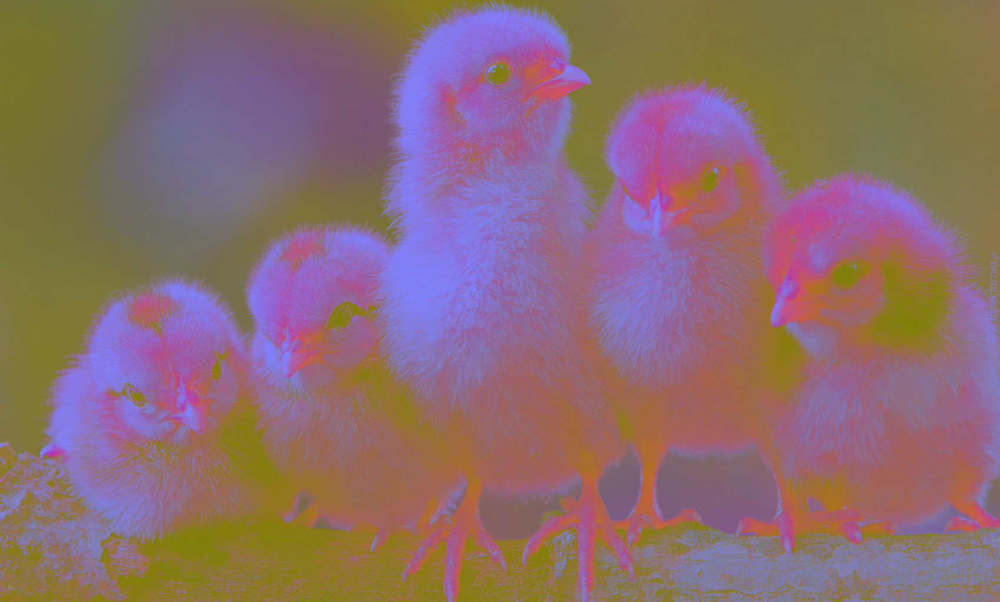

In [ ]:
image = cv2.cvtColor(src, cv2.COLOR_BGR2YUV )
#YUV stands for (Y) luma, or brightness, (U) blue projection and (V) red projection.
#HSL stands for (H) hue, (S) saturation, and L (lightness) 
#CMYK stands for (C ) cyan, (M) magenta, (Y) yellow and (K) black.
cv2_imshow( image)

  Noise

In [ ]:
import skimage.io
print(skimage.__version__)

0.18.3


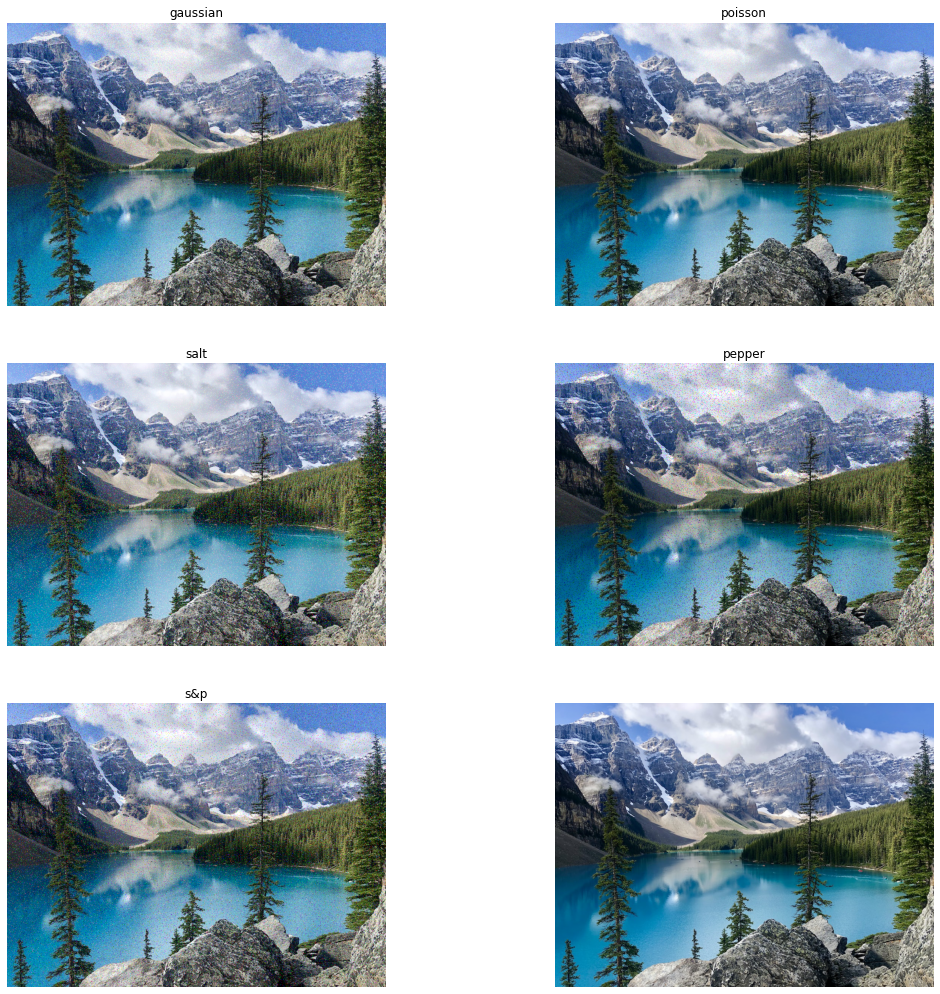

In [ ]:
import matplotlib.pyplot as plt
img_path="https://images.unsplash.com/photo-1610878180933-123728745d22?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxzZWFyY2h8Mnx8Y2FuYWRhJTIwbmF0dXJlfGVufDB8fDB8fA%3D%3D&w=1000&q=80"
img = skimage.io.imread(img_path)/255.0
#white noise is a random signal having equal intensity at different frequencies, giving it a constant power spectral density.
def plotnoise(img, mode, r, c, i):
    plt.subplot(r,c,i)
    if mode is not None:
        gimg = skimage.util.random_noise(img, mode=mode)
        plt.imshow(gimg)
    else:
        plt.imshow(img)
    plt.title(mode)
    plt.axis("off")

plt.figure(figsize=(18,24))
r=4
c=2
plotnoise(img, "gaussian", r,c,1)   #laying a translucent material on top of the image
plotnoise(img, "poisson", r,c,2)
plotnoise(img, "salt", r,c,3)   
plotnoise(img, "pepper", r,c,4)
plotnoise(img, "s&p", r,c,5)   # sparsely occurring white and black pixels.
plotnoise(img, None, r,c,6)
plt.show()

#MEAN FILTER

(<matplotlib.axes._subplots.AxesSubplot at 0x7f66da0652d0>,
 Text(0.5, 1.0, 'ImageafterMean Filter'))

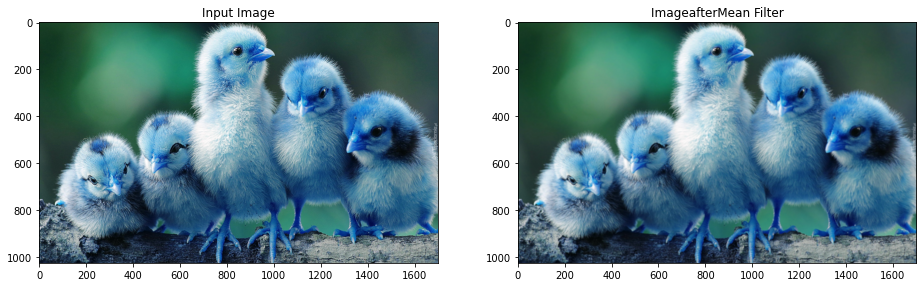

In [ ]:
#The median filter is also a sliding-window spatial filter, but it replaces the center value in the window with the median of all the pixel values in the window.

import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('image2.jpg')
kernel = np.ones((5,5),np.float32)/25
meanFilter = cv2.filter2D(img,-1,kernel)


plt.figure(figsize=(50, 50), constrained_layout=False)
plt.subplot(161), plt.imshow(img), plt.title("Input Image")
plt.subplot(162), plt.imshow(meanFilter), plt.title("ImageafterMean Filter")


#Gaussian Blurr

(<matplotlib.axes._subplots.AxesSubplot at 0x7f66d9fa1d50>,
 Text(0.5, 1.0, 'ImageafterGaussianSmoothing'))

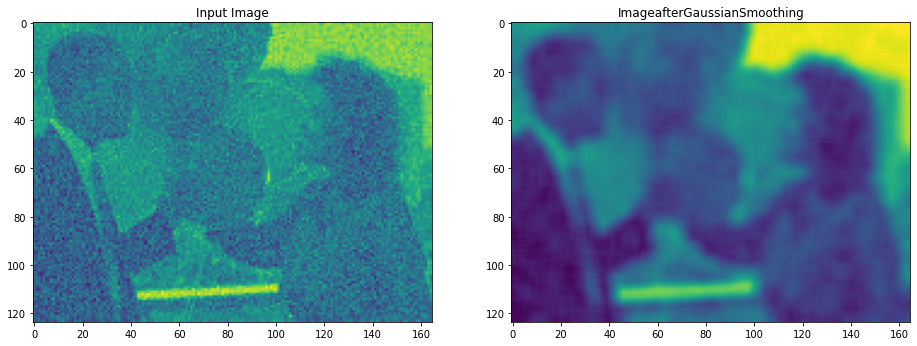

In [ ]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt

oimg = cv2.imread('images.jpg',0)
gaussBlur =cv2.GaussianBlur(oimg,(7,7),cv2.BORDER_DEFAULT)
plt.figure(figsize=(50, 50), constrained_layout=False)
plt.subplot(161), plt.imshow(oimg), plt.title("Input Image")
plt.subplot(162), plt.imshow(gaussBlur), plt.title("ImageafterGaussianSmoothing")


#High pass filter

 A high pass filter tends to retain the high frequency information within an image while reducing the low frequency information. Sharpening-edge detection

(<matplotlib.axes._subplots.AxesSubplot at 0x7f66da606410>,
 Text(0.5, 1.0, 'Gaussian filtered Image'))

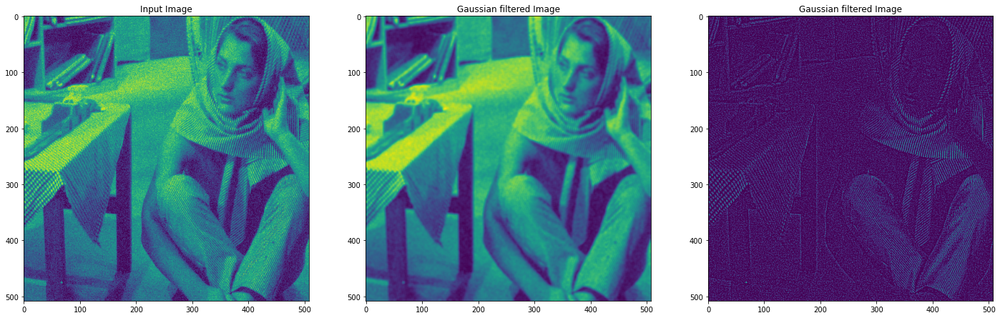

In [ ]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt 

oimg = cv2.imread('noisy.bmp',0)
gaussBlur =cv2.GaussianBlur(oimg,(5,5),cv2.BORDER_DEFAULT)
#cv2.imshow("Gaussian Smoothing",np.hstack((oimg,gaussBlur)))

plt.figure(figsize=(50,50), constrained_layout=False)
plt.subplot(161), plt.imshow(oimg), plt.title("Input Image")
plt.subplot(162), plt.imshow(gaussBlur), plt.title("Gaussian filtered Image")

hpf=cv2.subtract(oimg, gaussBlur)#oimg – gaussBlur
# or We can use this statement to filter the high pass image
#hpf = hpf + 127*np.ones(oimg.shape, np.uint8)
plt.subplot(163), plt.imshow(hpf), plt.title("Gaussian filtered Image")
#cv2.imshow("High Pass",np.hstack((img, highPass)))


#Low pass filter smoothening

(<matplotlib.axes._subplots.AxesSubplot at 0x7f66f23ac2d0>,
 Text(0.5, 1.0, 'Image after Lowpass filter'))

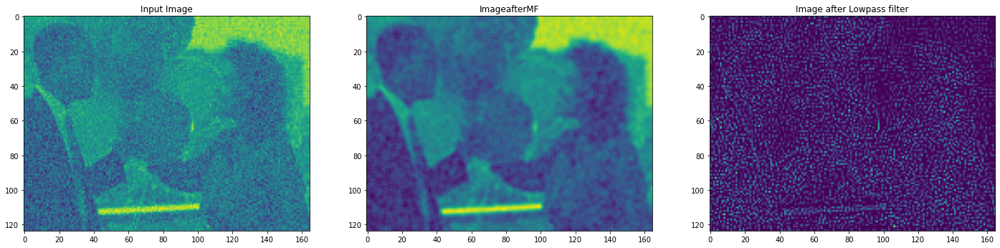

In [ ]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt 
oimg = cv2.imread('images.jpg',0)
kernel = np.ones((3,3),np.float32)/9
mf = cv2.filter2D(oimg,-1, kernel)
lpf = cv2.subtract(oimg, mf)
plt.figure(figsize=(50,50), constrained_layout=False)
plt.subplot(161), plt.imshow(oimg), plt.title("Input Image")
plt.subplot(162), plt.imshow(mf), plt.title("ImageafterMF")
plt.subplot(163), plt.imshow(lpf), plt.title("Image after Lowpass filter")


#Laplacian filter -edge detection

(<matplotlib.axes._subplots.AxesSubplot at 0x7f66da9ab890>,
 Text(0.5, 1.0, 'ImageafterLaplacianFilter'))

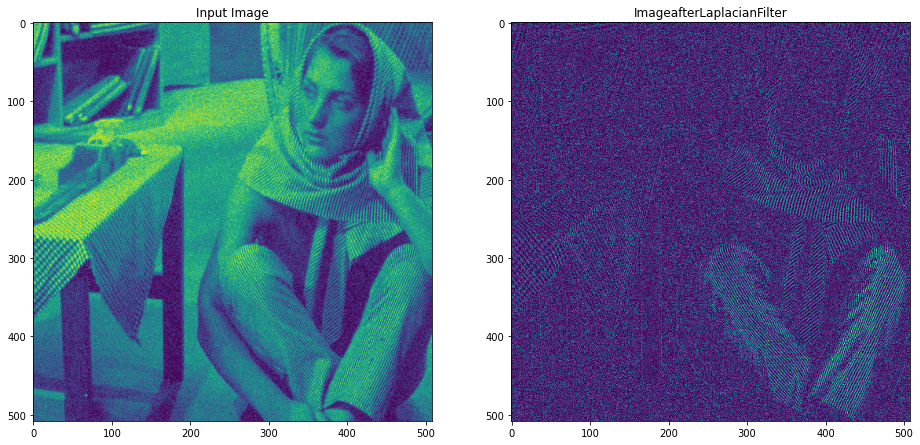

In [ ]:
#high pass spatial filters (Sobel, Prewitt, Roberts, Differentiation and Laplacian)
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt

oimg = cv2.imread('noisy.bmp',0)
#img = cv2.cvtColor(oimg,cv2.COLOR_BGR2RGB)
LaplacianFilter = cv2.Laplacian(oimg, 24, (5,5))

plt.figure(figsize=(50, 50), constrained_layout=False)
plt.subplot(161), plt.imshow(oimg), plt.title("Input Image")
plt.subplot(162), plt.imshow(LaplacianFilter), plt.title("ImageafterLaplacianFilter")



#Bilateral filter -smoothening images and reducing noise, while preserving edges

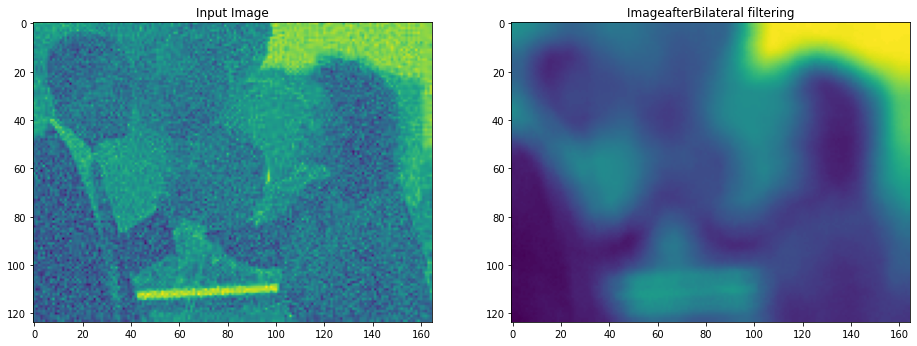

In [ ]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt

oimg = cv2.imread('images.jpg',0)
#img = cv2.cvtColor(oimg,cv2.COLOR_BGR2RGB)
bifilter = cv2.bilateralFilter(oimg,20,200,300)
plt.figure(figsize=(50, 50), constrained_layout=False)
plt.subplot(161), plt.imshow(oimg), plt.title("Input Image")
plt.subplot(162), plt.imshow(bifilter), plt.title("ImageafterBilateral filtering")

#Minimum and maximum filter
from PIL import Image, ImageFilter
   
# creating a image object
im1 = Image.open(r"images.jpg")
   





#Minimum and maximum filter

the minimum filter replaces the central pixel with the darkest one in the running window, the maximum filter replaces it with the lightest one.

(<matplotlib.axes._subplots.AxesSubplot at 0x7f66da686ed0>,
 Text(0.5, 1.0, 'ImageafterMinimum Filter'))

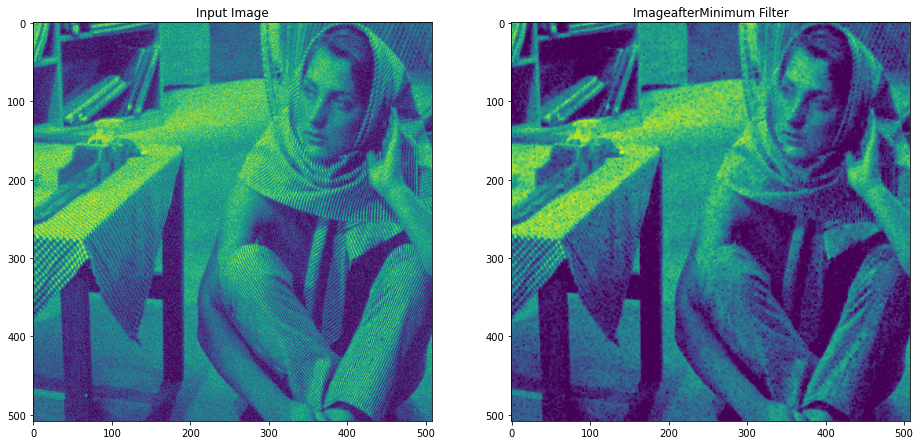

In [ ]:
from PIL import Image, ImageFilter
   
# creating a image object
im1 = Image.open(r"noisy.bmp")
   
# applying the min filter
im2 = im1.filter(ImageFilter.MinFilter(size = 3))
#im2 = im1.filter(ImageFilter.MaxFilter(size = 3))

import matplotlib.pyplot as plt
plt.figure(figsize=(50, 50), constrained_layout=False)
plt.subplot(161), plt.imshow(im1), plt.title("Input Image")
plt.subplot(162), plt.imshow(im2), plt.title("ImageafterMinimum Filter")



